# VUmc OOD Detection Explanation Notebook

## Background

### Out-of-distribution detection

When training a prediction model, we assume that it is going to be used on samples that are similar to the training data. Despite the effort of making models as generalizable as possible, the underlaying assumption is that samples are coming from the same distribution. However, in real-world applications, it is difficult to control the sample distribution or limit usage of the model. In critical areas such as healthcare, this can have fatal consequences. To avoid overconfident predictions on samples the model has never seen before, it is neccessary to be able to detect *out-of distribution* (OOD) samples verifiably.

### Discriminators and density estimators

We can divide the out-of-distribution detection techniques into two groups: discriminators and density estimators.

**Descriminators** such as standard feedfowrard neural networks, ensemble networks, or MCDropout network, can be used to provide both prediction and uncertainty score that indicates how uncertain the model is in the prediction.

**Density estimators**, on the other hand, can be used separately from the main prediction model. They flag samples that are in low-density areas -- feature space with no of very few training data present.

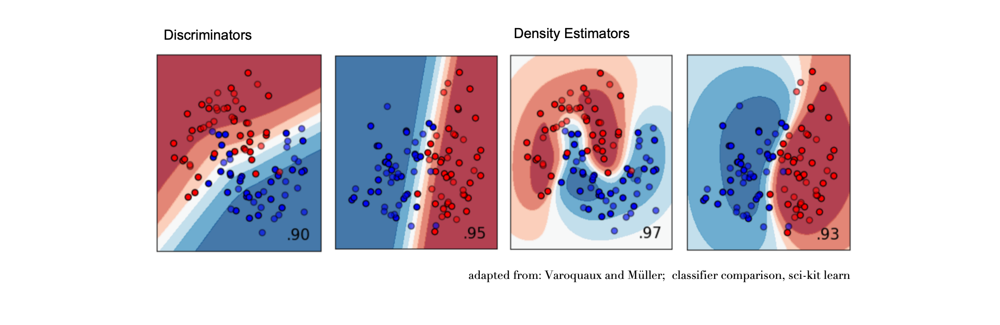

## Selected Models

To obtain a model-agnostic estimate of novelty, we used several density estimators on the VUmc dataset:


<ul>
    <li>Probabilitic PCA (PPCA) </li>
     <li>Local Outlier Factor (LOF) </li>
    <li>Autoencoder (AE) </li>
     <li>Variational Autoencoder (VAE) </li>
     <li>Deep Kernel Learning - Deterministic Uncertainty Estimator (DUE) </li>
    
</ul>
        

## Feature Importance

Here, we present two approaches for estimating the effect of each feature on the overall uncertainty score. 
* Feature-wise reconstruction error for autoencoders (AE) or variational autoencoders (VAE)
* SHAP values for each model

## Demo

In [145]:
import sys
import os
from collections import defaultdict

import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt
from tabulate import tabulate

ROOT_PATH = '/home/karina/ehr_ood_detection/'
sys.path.append(ROOT_PATH)

from src.models.info import DENSITY_ESTIMATORS
from src.utils.datahandler import DataHandler, load_data_from_origin
from src.models.novelty_estimator import NoveltyEstimator, SCORING_FUNCS
from src.utils.model_init import init_models
from src.evaluation.feature_importance import plot_shap,get_reconstr_features

DATA_ORIGIN = "VUmc"

In [84]:
def get_feature_wise_reconstr(ne: NoveltyEstimator,
                              ID: int,
                              X: pd.DataFrame,
                              N: int = 10
                              ):
    method_name = ne.__dict__['name']
    print(f"{method_name} Feature-Wise Reconstruction Error")
    pd.set_option('display.float_format', '{:.3f}'.format)

    sample = X.loc[[ID]].values

    if method_name == "AE":
        z = ne.model.model.encoder(torch.from_numpy(sample).float())
        reconstr = ne.model.model.decoder(z)
        reconstr = reconstr.detach().numpy()

    elif method_name == "VAE":
        mean, std = ne.model.model.encoder(torch.from_numpy(sample).float())
        eps = torch.randn(mean.shape)
        z = mean + eps * std
        reconstr = ne.model.model.decoder(z, reconstruction_mode='sample')
        reconstr = reconstr.detach().numpy()

    reconstr_df = pd.DataFrame({'original (scaled)': sample.flatten(),
                                "reconstr": reconstr.flatten(),
                                "absolute error": np.abs(sample - reconstr)[0]},
                               index=X.columns)
    reconstr_df = reconstr_df.sort_values(by='absolute error', ascending=False)[:N]
    return reconstr_df

In [7]:
# Display a table of booleans indicating whether a patient is flagged as OOD

ood_table = pd.read_csv(os.path.join(ROOT_PATH, f"data/novelty_tables/{DATA_ORIGIN}/novelty_scores",
                                     "outliers_density.csv"),index_col = 0)
ood_table.index.name = 'Patient ID'
ood_table.head()

,AE (reconstr err),LOF (outlier score),PPCA (log prob),VAE (latent prior prob),VAE (latent prob),VAE (reconstr err),VAE (reconstr err grad),Number of models
Patient ID,,,,,,,,
824,True,True,True,True,True,True,False,6
6796,True,True,True,True,False,True,True,6
4145,True,True,True,True,False,True,True,6
191,True,True,True,True,True,True,False,6
7304,True,True,True,False,True,True,False,5


## Train models

In [ ]:
# Load training and testing data

data_loader = load_data_from_origin(DATA_ORIGIN)
dh = DataHandler(**data_loader)
X_train, y_train, X_test, y_test, _, _ = dh.get_processed_data(scale=True)


In [156]:
# Train Density Models

novelty_estimators = defaultdict(dict)

for model_info in init_models(input_dim=X_train.shape[1], 
                              selection=DENSITY_ESTIMATORS, 
                              origin=DATA_ORIGIN):
    
    print("\n\n", model_info[2])
    ne, scoring_funcs, method_name = model_info 
    ne.train(X_train.values, y_train.values, X_val.values, y_val.values)
    novelty_estimators[method_name] = {"model": ne, "scoring_funcs": scoring_funcs}
    



 VAE


100%|██████████| 198/198 [03:43<00:00,  1.13s/it]




 LOF


 AE


 PPCA


 DUE


 20%|██        | 1/5 [06:56<27:47, 416.79s/it]

Epoch: 0. Train loss: 0.293.


 40%|████      | 2/5 [14:14<21:27, 429.30s/it]

Epoch: 1. Train loss: 0.208.


 60%|██████    | 3/5 [21:24<14:18, 429.39s/it]

Epoch: 2. Train loss: 0.204.


 80%|████████  | 4/5 [29:05<07:21, 441.84s/it]

Epoch: 3. Train loss: 0.201.


100%|██████████| 5/5 [33:22<00:00, 400.42s/it]

Epoch: 4. Train loss: 0.197.


In [224]:
pd.DataFrame({f'{method_name}': feature_importance[191][f'{method_name}'] for method_name in ["VAE", "AE"]})

,VAE,AE
0,bilirubin mean overall diff,bilirubin mean overall diff
1,asat mean overall diff,asat mean overall diff
2,bilirubin minimum last 24h,bilirubin minimum last 24h
3,bilirubin last overall,bilirubin last overall
4,bilirubin mean last 24h,bilirubin mean last 24h
5,bilirubin maximum last 24h,bilirubin maximum last 24h
6,bilirubin standard deviation overall,bilirubin standard deviation overall
7,asat maximum first 24h,asat maximum first 24h
8,asat standard deviation overall,asat standard deviation overall
9,asat mean first 24h,asat mean first 24h


###  Patient ID = 824
Flagged as OOD by all 6 models.

VAE reconstr_err


  0%|          | 0/1 [00:00<?, ?it/s]

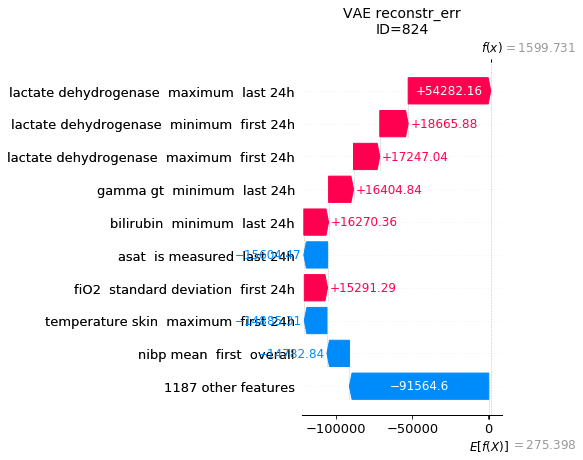

VAE latent_prob


  0%|          | 0/1 [00:00<?, ?it/s]

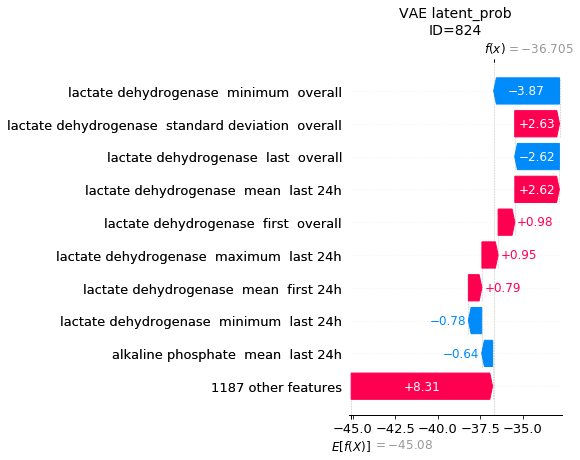

VAE latent_prior_prob


  0%|          | 0/1 [00:00<?, ?it/s]

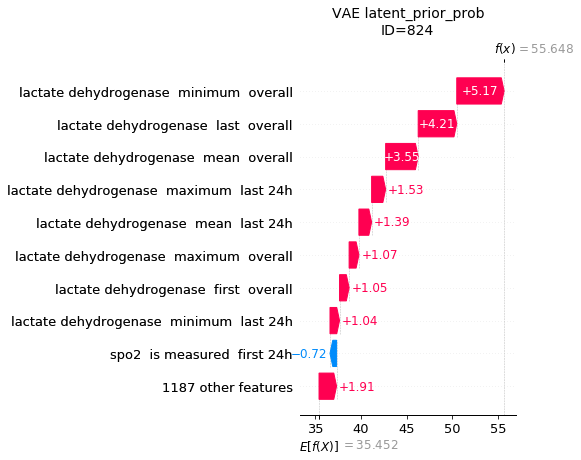

VAE reconstr_err_grad


  0%|          | 0/1 [00:00<?, ?it/s]

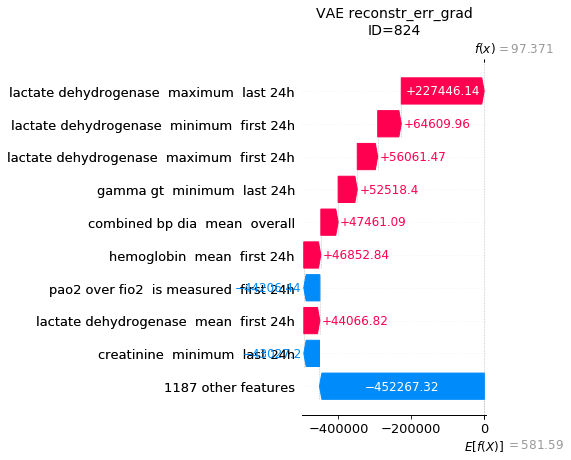

PPCA log_prob


  0%|          | 0/1 [00:00<?, ?it/s]

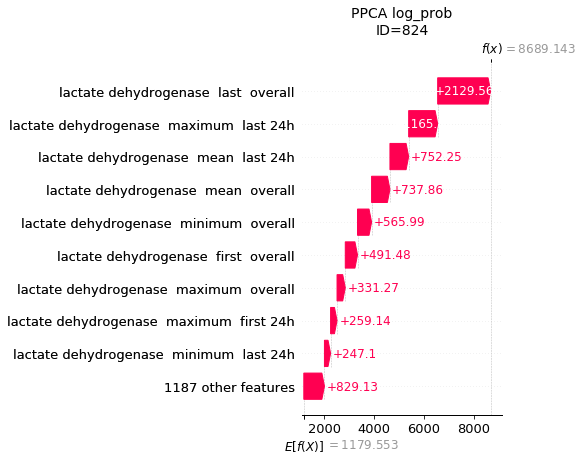

DUE entropy


  0%|          | 0/1 [00:00<?, ?it/s]

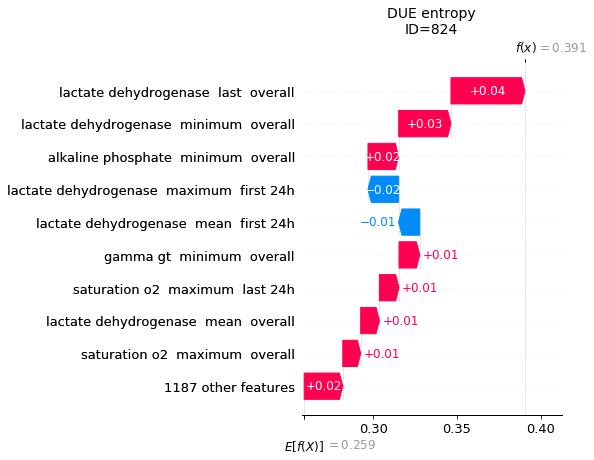

DUE std


  0%|          | 0/1 [00:00<?, ?it/s]

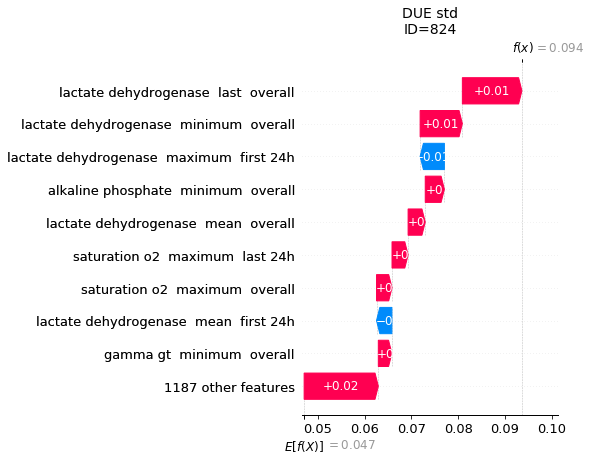

LOF outlier_score


  0%|          | 0/1 [00:00<?, ?it/s]

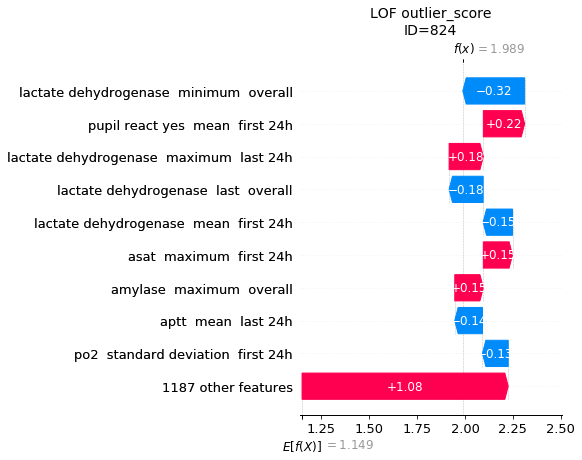

AE reconstr_err


  0%|          | 0/1 [00:00<?, ?it/s]

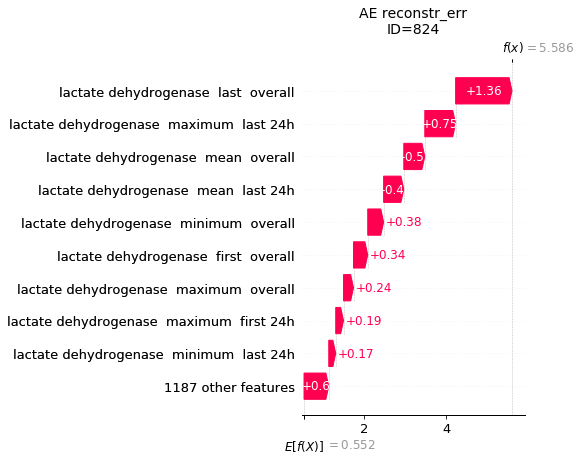

In [157]:
ID = 824

for model_name in DENSITY_ESTIMATORS:
    for scoring_func in novelty_estimators[model_name]['scoring_funcs']:
        
        print(model_name, scoring_func)
        
        plot_shap(ne=novelty_estimators[model_name]['model'],
                  scoring_func=scoring_func,
                  X_train=X_train,
                  X_test=X_test,
                  indices=[ID],
                  plot_type='waterfall')

VAE reconstr_err


  0%|          | 0/1 [00:00<?, ?it/s]

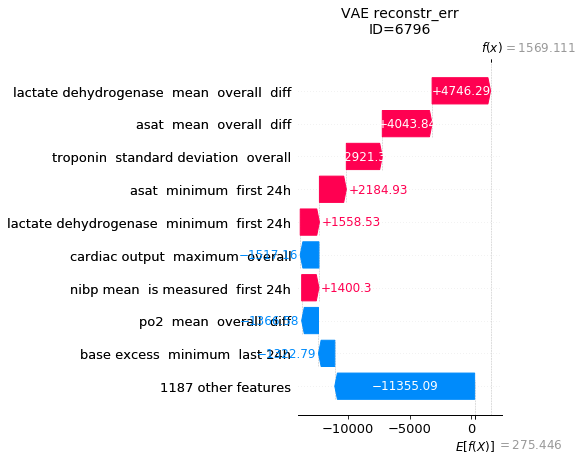

VAE latent_prob


  0%|          | 0/1 [00:00<?, ?it/s]

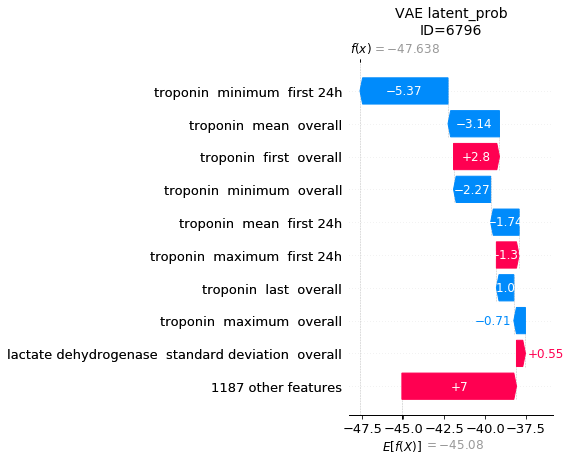

VAE latent_prior_prob


  0%|          | 0/1 [00:00<?, ?it/s]

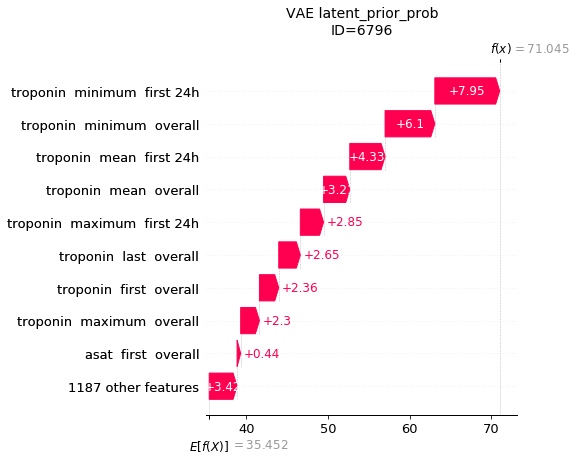

VAE reconstr_err_grad


  0%|          | 0/1 [00:00<?, ?it/s]

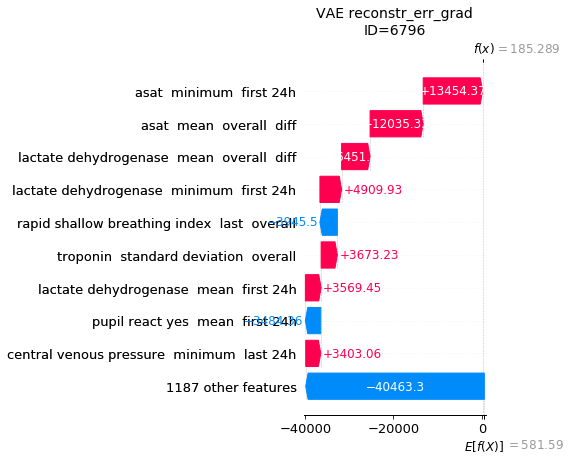

PPCA log_prob


  0%|          | 0/1 [00:00<?, ?it/s]

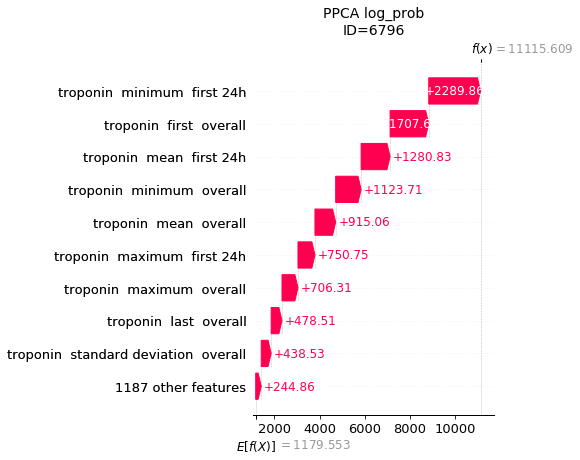

DUE entropy


  0%|          | 0/1 [00:00<?, ?it/s]

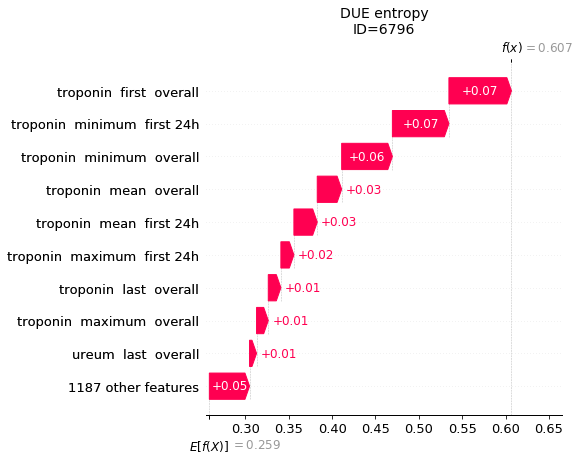

DUE std


  0%|          | 0/1 [00:00<?, ?it/s]

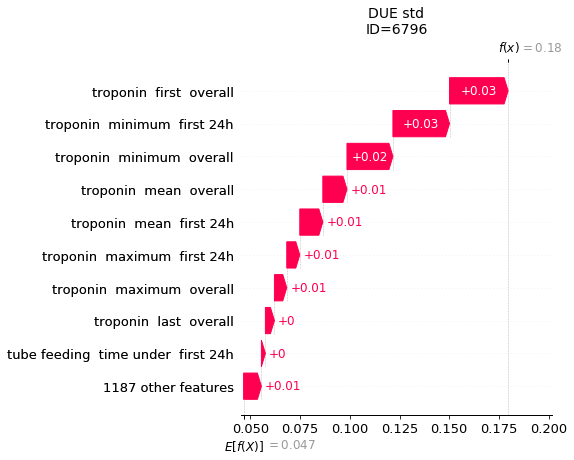

LOF outlier_score


  0%|          | 0/1 [00:00<?, ?it/s]

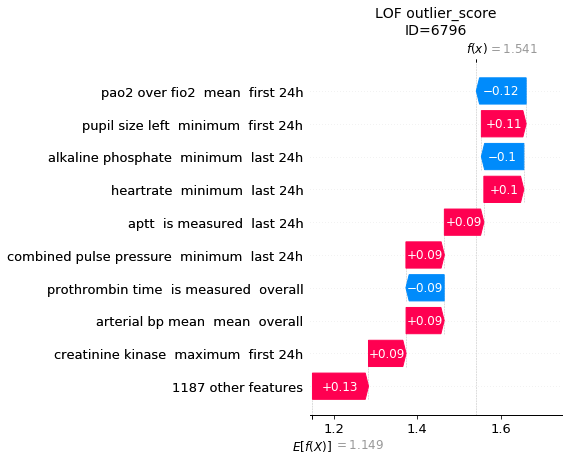

AE reconstr_err


  0%|          | 0/1 [00:00<?, ?it/s]

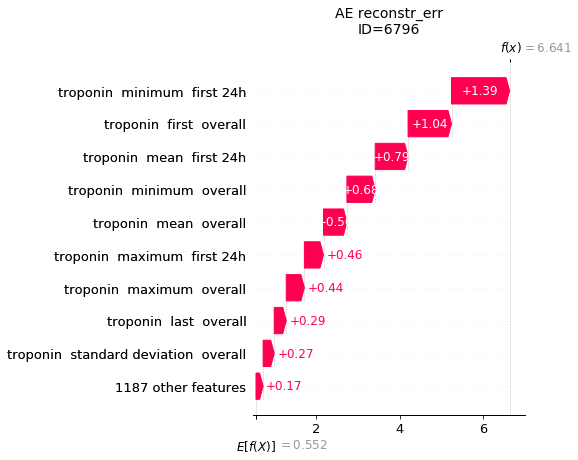

In [158]:
ID = 6796

for model_name in DENSITY_ESTIMATORS:
    for scoring_func in novelty_estimators[model_name]['scoring_funcs']:
        
        print(model_name, scoring_func)
        
        plot_shap(ne=novelty_estimators[model_name]['model'],
                  scoring_func=scoring_func,
                  X_train=X_train,
                  X_test=X_test,
                  indices=[ID],
                  plot_type='waterfall')

VAE reconstr_err


  0%|          | 0/1 [00:00<?, ?it/s]

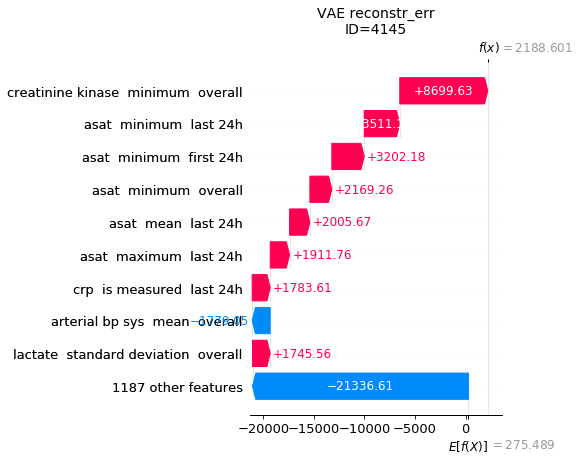

VAE latent_prob


  0%|          | 0/1 [00:00<?, ?it/s]

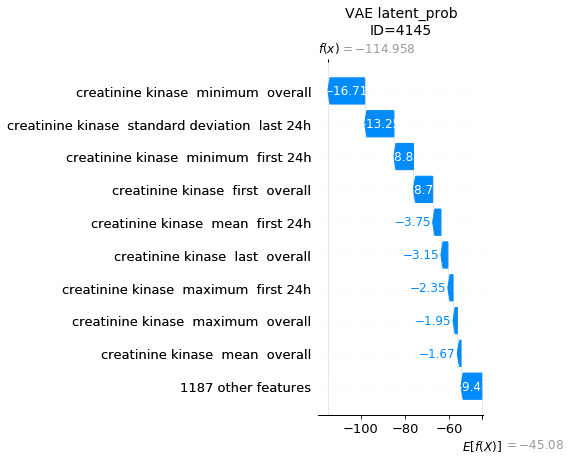

VAE latent_prior_prob


  0%|          | 0/1 [00:00<?, ?it/s]

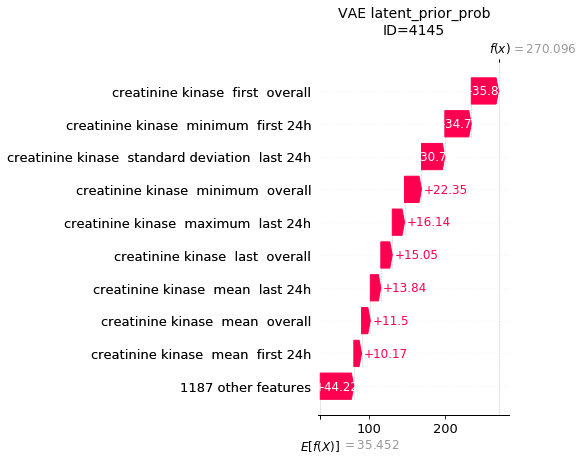

VAE reconstr_err_grad


  0%|          | 0/1 [00:00<?, ?it/s]

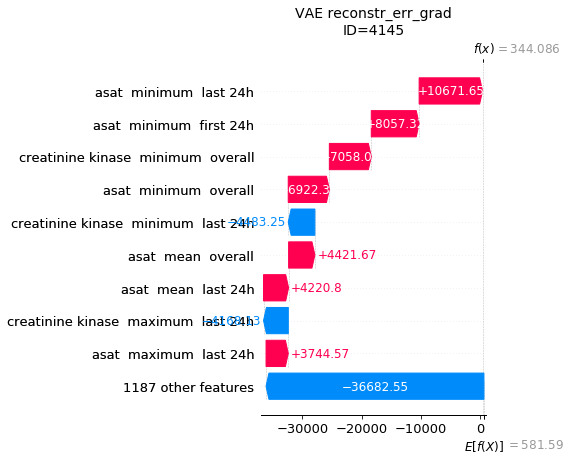

PPCA log_prob


  0%|          | 0/1 [00:00<?, ?it/s]

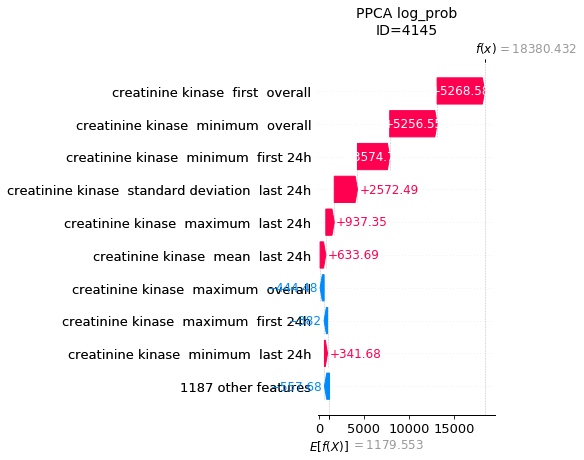

DUE entropy


  0%|          | 0/1 [00:00<?, ?it/s]

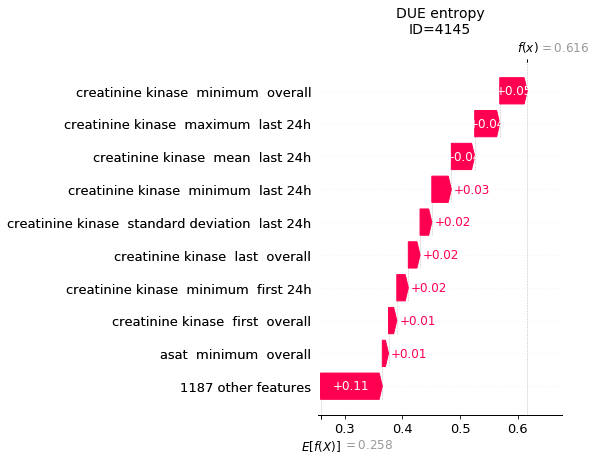

DUE std


  0%|          | 0/1 [00:00<?, ?it/s]

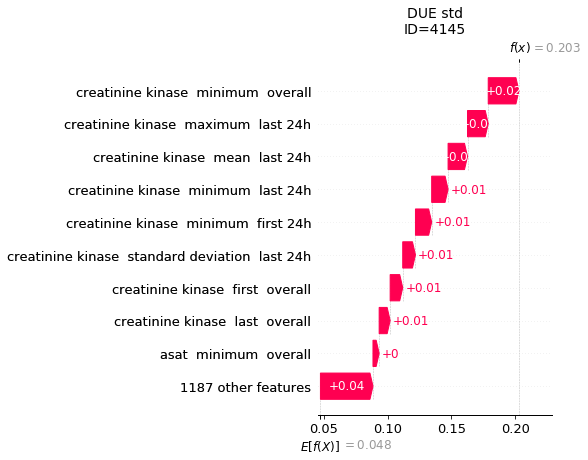

LOF outlier_score


  0%|          | 0/1 [00:00<?, ?it/s]

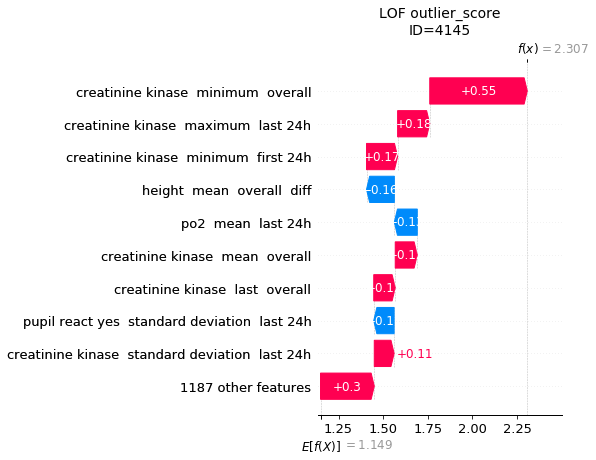

AE reconstr_err


  0%|          | 0/1 [00:00<?, ?it/s]

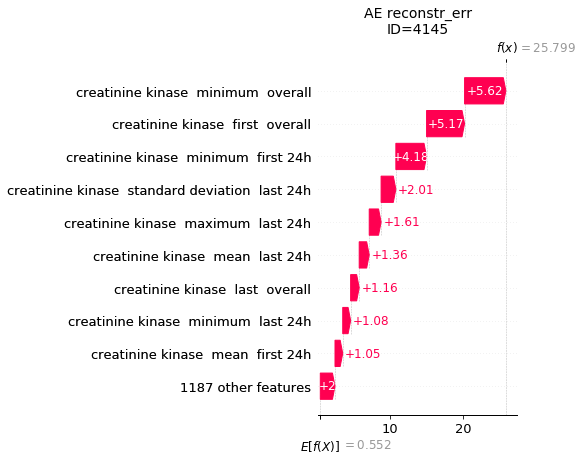

In [159]:
ID = 4145

for model_name in DENSITY_ESTIMATORS:
    for scoring_func in novelty_estimators[model_name]['scoring_funcs']:
        
        print(model_name, scoring_func)
        
        plot_shap(ne=novelty_estimators[model_name]['model'],
                  scoring_func=scoring_func,
                  X_train=X_train,
                  X_test=X_test,
                  indices=[ID],
                  plot_type='waterfall')

In [260]:
from typing import Union

def get_shap(ne,
             scoring_func: str,
             X_train: pd.DataFrame,
             X_test: pd.DataFrame,
             indices: Union[list, int],
             N: int = 10):
    if type(indices) is int:
        indices = list(indices)

    f = lambda X: ne.get_novelty_score(data=X, scoring_func=scoring_func).flatten()
    X_train_sample = shap.utils.sample(X_train.values, nsamples=100, random_state=0)

    explainer = shap.KernelExplainer(f, X_train_sample)
    shap_values = explainer.shap_values(X_test.loc[indices].values)

    feature_names = list(map(lambda x: x.replace('_', ' '), X_test.columns))
    feature_importance = dict()

    for i, index in enumerate(indices):
        importance_order = np.argsort(-1 * np.abs(shap_values))
        feature_importance[index] = np.array(feature_names)[importance_order][:N].flatten().tolist()

    return feature_importance

In [261]:
ID = 191

for model_name in {"AE"}:
    for scoring_func in novelty_estimators[model_name]['scoring_funcs']:
        
        print(model_name, scoring_func)
        
        feature_importance =  get_shap(ne=novelty_estimators[model_name]['model'],
                                                                              scoring_func=scoring_func,
                                                                              X_train=X_train,
                                                                              X_test=X_test,
                                                                              indices=[ID])[ID]


AE reconstr_err


  0%|          | 0/1 [00:00<?, ?it/s]

In [273]:
import json

save_dir = os.path.join('/home/karina/ehr_ood_detection/','data/results', DATA_ORIGIN, "feature_importance")

if not os.path.exists(save_dir):
    os.mkdir(save_dir)

with open(os.path.join(save_dir, f"{method_name}_SHAP.json"),
                                  "w", encoding="utf8") as f:
    
    json.dump(feature_importance, f, indent=4)

In [271]:
save_dir

'/data/results/VUmc/feature_importance'

In [ ]:
ID = 7304

for model_name in DENSITY_ESTIMATORS:
    for scoring_func in novelty_estimators[model_name]['scoring_funcs']:
        
        print(model_name, scoring_func)
        
        plot_shap(ne=novelty_estimators[model_name]['model'],
                  scoring_func=scoring_func,
                  X_train=X_train,
                  X_test=X_test,
                  indices=[ID],
                  plot_type='waterfall')

In [ ]:
ID = 4072

for model_name in DENSITY_ESTIMATORS:
    for scoring_func in novelty_estimators[model_name]['scoring_funcs']:
        
        print(model_name, scoring_func)
        
        plot_shap(ne=novelty_estimators[model_name]['model'],
                  scoring_func=scoring_func,
                  X_train=X_train,
                  X_test=X_test,
                  indices=[ID],
                  plot_type='waterfall')

#### SHAP Values
AE reconstruction errorPPCA log probability
DUE entropy
 LOF outlier score

<!-- 
 -->



#### Feature-Wise Reconstruction Error

Autoencoder resonstruction error

In [227]:
# Autoencoder
model_name = "AE"

reconstr = get_feature_wise_reconstr(novelty_estimators[model_name]['model'], ID=ID, X=X_test)

reconstr[['absolute error']].plot.barh(color='salmon')
plt.title(f"{model_name} Reconstruction Error\nID={ID}")
plt.show()

print(tabulate(reconstr, tablefmt="pipe", headers="keys"))

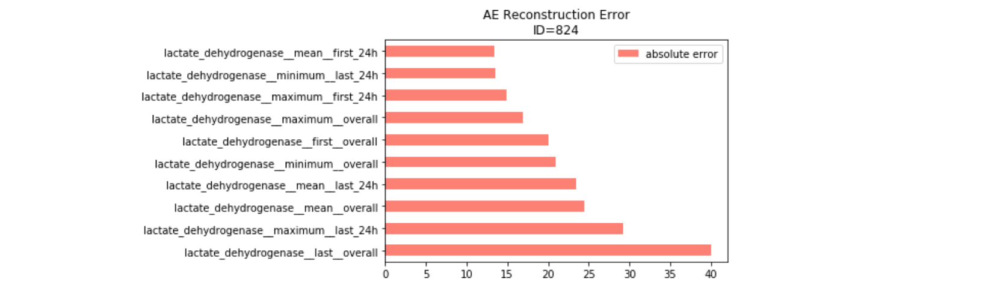

|                                           |   original (scaled) |   reconstr |   absolute error |
|:------------------------------------------|--------------------:|-----------:|-----------------:|
| lactate_dehydrogenase__last__overall      |             40.9633 |   0.940631 |          40.0227 |
| lactate_dehydrogenase__maximum__last_24h  |             30.1537 |   0.961272 |          29.1924 |
| lactate_dehydrogenase__mean__overall      |             25.4461 |   0.956962 |          24.4891 |
| lactate_dehydrogenase__mean__last_24h     |             24.4114 |   0.966918 |          23.4444 |
| lactate_dehydrogenase__minimum__overall   |             21.8727 |   0.973821 |          20.8989 |
| lactate_dehydrogenase__first__overall     |             20.9968 |   0.973037 |          20.0238 |
| lactate_dehydrogenase__maximum__overall   |             17.8527 |   0.959622 |          16.8931 |
| lactate_dehydrogenase__maximum__first_24h |             15.8178 |   0.959661 |          14.8581 |
| lactate_dehydrogenase__minimum__last_24h  |             14.5521 |   0.960047 |          13.5921 |
| lactate_dehydrogenase__mean__first_24h    |             14.3193 |   0.968536 |          13.3508 |


Variational Autoencoder reconstruction error

In [154]:
# Variational autoencoder
model_name = "VAE"

reconstr = get_feature_wise_reconstr(novelty_estimators[model_name]['model'], ID=ID, X=X_test)

reconstr[['absolute error']].plot.barh(color='salmon')
plt.title(f"{model_name} Reconstruction Error\nID={ID}")
plt.show()

print(tabulate(reconstr, tablefmt="pipe", headers="keys"))

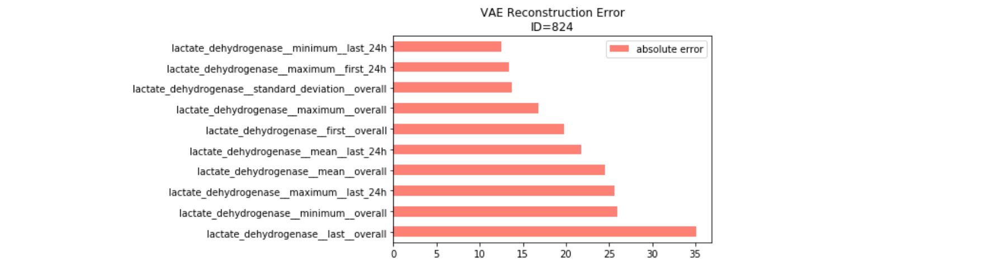

|                                           |   original (scaled) |   reconstr |   absolute error |
|:------------------------------------------|--------------------:|-----------:|-----------------:|
| lactate_dehydrogenase__last__overall      |             40.9633 |  0.365951  |          40.5974 |
| lactate_dehydrogenase__maximum__last_24h  |             30.1537 | -2.49846   |          32.6522 |
| lactate_dehydrogenase__mean__last_24h     |             24.4114 |  0.564197  |          23.8472 |
| lactate_dehydrogenase__mean__overall      |             25.4461 |  1.95021   |          23.4959 |
| lactate_dehydrogenase__first__overall     |             20.9968 |  0.0890228 |          20.9078 |
| lactate_dehydrogenase__minimum__overall   |             21.8727 |  2.59042   |          19.2823 |
| lactate_dehydrogenase__maximum__overall   |             17.8527 |  2.17584   |          15.6768 |
| lactate_dehydrogenase__mean__first_24h    |             14.3193 | -0.339237  |          14.6586 |
| lactate_dehydrogenase__minimum__last_24h  |             14.5521 |  1.56208   |          12.99   |
| lactate_dehydrogenase__maximum__first_24h |             15.8178 |  3.33292   |          12.4849 |



### OOD Patient ID = 6796
Flagged as OOD by all 6 models.

#### SHAP Values

#### Feature-Wise Reconstruction Error

### Patient ID = 4145
Flagged as OOD by all 6 models.


#### SHAP Values

### OOD Patient ID = 191
Flagged as OOD by all 6 models.


#### SHAP Values

#### Feature-Wise Reconstruction Error

### OOD Patient ID = 7304
Flagged as OOD by 5 out of 6 models.


#### SHAP Values

### OOD Patient ID = 4072
In-distribution patient (was not flagged as OOD by any model).


#### SHAP Values